<a href="https://colab.research.google.com/github/babazibidi/pdfreading/blob/main/NaturalLanguageProccessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Duygu analizi ve Duygu Sınıflandırılması

In [ ]:
!pip install nltk
!pip install textblob
!pip install wordcloud

In [1]:
from warnings import filterwarnings
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image
from nltk.corpus import stopwords
from nltk.sentiment import SentimentIntensityAnalyzer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, GridSearchCV, cross_validate
from sklearn.preprocessing import LabelEncoder
from textblob import Word, TextBlob
from wordcloud import WordCloud

In [2]:
filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)
pd.set_option('display.float_format', lambda x: '%.2f' % x)

In [ ]:
# Test Preprocessing

In [37]:
df = pd.read_csv('/content/amazon_reviews.csv', sep=',')

In [38]:
df.head() # Bir ürüne yapılmış bütün yorumları içermektedir.

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime,day_diff,helpful_yes,total_vote
0,A3SBTW3WS4IQSN,B007WTAJTO,NaN,"[0, 0]",No issues.,4.00,Four Stars,1406073600,2014-07-23,138,0,0
1,A18K1ODH1I2MVB,B007WTAJTO,0mie,"[0, 0]","Purchased this for my device, it worked as adv...",5.00,MOAR SPACE!!!,1382659200,2013-10-25,409,0,0
2,A2FII3I2MBMUIA,B007WTAJTO,1K3,"[0, 0]",it works as expected. I should have sprung for...,4.00,nothing to really say....,1356220800,2012-12-23,715,0,0
3,A3H99DFEG68SR,B007WTAJTO,1m2,"[0, 0]",This think has worked out great.Had a diff. br...,5.00,Great buy at this price!!! *** UPDATE,1384992000,2013-11-21,382,0,0
4,A375ZM4U047O79,B007WTAJTO,2&amp;1/2Men,"[0, 0]","Bought it with Retail Packaging, arrived legit...",5.00,best deal around,1373673600,2013-07-13,513,0,0


In [ ]:
# Normalizing Case Folding

In [39]:
df['reviewText']

,reviewText
0,No issues.
1,"Purchased this for my device, it worked as advertised. You can never have too much phone memory, since I download a lot of stuff this was a no brainer for me."
2,it works as expected. I should have sprung for the higher capacity. I think its made a bit cheesier than the earlier versions; the paint looks not as clean as before
3,"This think has worked out great.Had a diff. bran 64gb card and if went south after 3 months.This one has held up pretty well since I had my S3, now on my Note3.*** update 3/21/14I've had this for a few months and have had ZERO issue's since it was transferred from my S3 to my Note3 and into a note2. This card is reliable and solid!Cheers!"
4,"Bought it with Retail Packaging, arrived legit, in a orange envelope, english version not asian like the picture shows. arrived quickly, bought a 32 and 16 both retail packaging for my htc one sv and Lg Optimus, both cards in working order, probably best price you'll get for a nice sd card"
5,It's mini storage. It doesn't do anything else and it's not supposed to. I purchased it to add additional storage to my Microsoft Surface Pro tablet which only come in 64 and 128 GB. It does what it's supposed to and SanDisk has a long standing reputation that speaks for itself.
6,I have it in my phone and it never skips a beat. File transfers are speedy and have not had any corruption issues or memory fade issues as I would expect from the Sandisk brand. Great card to own. Why entrust your precious files to a slightly cheaper piece of crap? If you lose everything can you forgive yourself for not spending the extra couple bucks on a trusted product that goes through good QA?
7,It's hard to believe how affordable digital has become. 32 GB in a device one quarter the sie of postage stamp would have been science fiction less than a generation ago.I picked this up for portable music when I didn't want to schlep (or risk) a phone or iPod. Works great with all SD card readers.Select with confidence.
8,"Works in a HTC Rezound. Was running short of space on a 64GB Sandisk so I ordered this when it came out, fast and no issues."
9,"in my galaxy s4, super fast card, and am totally happy, not happy having to still type to fill the required words though"


In [40]:
df['reviewText'] = df['reviewText'].str.lower() # Bütün harflerin küçültülmesi

In [42]:
df['reviewText'].head()

,reviewText
0,no issues.
1,"purchased this for my device, it worked as advertised. you can never have too much phone memory, since i download a lot of stuff this was a no brainer for me."
2,it works as expected. i should have sprung for the higher capacity. i think its made a bit cheesier than the earlier versions; the paint looks not as clean as before
3,"this think has worked out great.had a diff. bran 64gb card and if went south after 3 months.this one has held up pretty well since i had my s3, now on my note3.*** update 3/21/14i've had this for a few months and have had zero issue's since it was transferred from my s3 to my note3 and into a note2. this card is reliable and solid!cheers!"
4,"bought it with retail packaging, arrived legit, in a orange envelope, english version not asian like the picture shows. arrived quickly, bought a 32 and 16 both retail packaging for my htc one sv and lg optimus, both cards in working order, probably best price you'll get for a nice sd card"


In [ ]:
# Gereksiz ifadelerin silinmesi ----> noktalama işaretleri, sayılar vb.

In [43]:
df['reviewText'] = df['reviewText'].str.replace('[^\w\s]', '', regex = True)

In [44]:
df['reviewText']

,reviewText
0,no issues
1,purchased this for my device it worked as advertised you can never have too much phone memory since i download a lot of stuff this was a no brainer for me
2,it works as expected i should have sprung for the higher capacity i think its made a bit cheesier than the earlier versions the paint looks not as clean as before
3,this think has worked out greathad a diff bran 64gb card and if went south after 3 monthsthis one has held up pretty well since i had my s3 now on my note3 update 32114ive had this for a few months and have had zero issues since it was transferred from my s3 to my note3 and into a note2 this card is reliable and solidcheers
4,bought it with retail packaging arrived legit in a orange envelope english version not asian like the picture shows arrived quickly bought a 32 and 16 both retail packaging for my htc one sv and lg optimus both cards in working order probably best price youll get for a nice sd card
5,its mini storage it doesnt do anything else and its not supposed to i purchased it to add additional storage to my microsoft surface pro tablet which only come in 64 and 128 gb it does what its supposed to and sandisk has a long standing reputation that speaks for itself
6,i have it in my phone and it never skips a beat file transfers are speedy and have not had any corruption issues or memory fade issues as i would expect from the sandisk brand great card to own why entrust your precious files to a slightly cheaper piece of crap if you lose everything can you forgive yourself for not spending the extra couple bucks on a trusted product that goes through good qa
7,its hard to believe how affordable digital has become 32 gb in a device one quarter the sie of postage stamp would have been science fiction less than a generation agoi picked this up for portable music when i didnt want to schlep or risk a phone or ipod works great with all sd card readersselect with confidence
8,works in a htc rezound was running short of space on a 64gb sandisk so i ordered this when it came out fast and no issues
9,in my galaxy s4 super fast card and am totally happy not happy having to still type to fill the required words though


In [ ]:
# Numbers

In [45]:
df['reviewText'] = df['reviewText'].str.replace('\d', '', regex = True)

In [46]:
df['reviewText']

,reviewText
0,no issues
1,purchased this for my device it worked as advertised you can never have too much phone memory since i download a lot of stuff this was a no brainer for me
2,it works as expected i should have sprung for the higher capacity i think its made a bit cheesier than the earlier versions the paint looks not as clean as before
3,this think has worked out greathad a diff bran gb card and if went south after monthsthis one has held up pretty well since i had my s now on my note update ive had this for a few months and have had zero issues since it was transferred from my s to my note and into a note this card is reliable and solidcheers
4,bought it with retail packaging arrived legit in a orange envelope english version not asian like the picture shows arrived quickly bought a and both retail packaging for my htc one sv and lg optimus both cards in working order probably best price youll get for a nice sd card
5,its mini storage it doesnt do anything else and its not supposed to i purchased it to add additional storage to my microsoft surface pro tablet which only come in and gb it does what its supposed to and sandisk has a long standing reputation that speaks for itself
6,i have it in my phone and it never skips a beat file transfers are speedy and have not had any corruption issues or memory fade issues as i would expect from the sandisk brand great card to own why entrust your precious files to a slightly cheaper piece of crap if you lose everything can you forgive yourself for not spending the extra couple bucks on a trusted product that goes through good qa
7,its hard to believe how affordable digital has become gb in a device one quarter the sie of postage stamp would have been science fiction less than a generation agoi picked this up for portable music when i didnt want to schlep or risk a phone or ipod works great with all sd card readersselect with confidence
8,works in a htc rezound was running short of space on a gb sandisk so i ordered this when it came out fast and no issues
9,in my galaxy s super fast card and am totally happy not happy having to still type to fill the required words though


In [ ]:
# Stop Word --- > Bağlaçların kaldırılması(ölçüm niteliği taşımayan kelimeler) is, for, of vb.

In [47]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [48]:
sw = stopwords.words('english')

In [50]:
df['reviewText'] = df['reviewText'].apply(lambda x: " ". join(x for x in str(x).split() if x not in sw))

In [51]:
df['reviewText']

,reviewText
0,issues
1,purchased device worked advertised never much phone memory since download lot stuff brainer
2,works expected sprung higher capacity think made bit cheesier earlier versions paint looks clean
3,think worked greathad diff bran gb card went south monthsthis one held pretty well since note update ive months zero issues since transferred note note card reliable solidcheers
4,bought retail packaging arrived legit orange envelope english version asian like picture shows arrived quickly bought retail packaging htc one sv lg optimus cards working order probably best price youll get nice sd card
5,mini storage doesnt anything else supposed purchased add additional storage microsoft surface pro tablet come gb supposed sandisk long standing reputation speaks
6,phone never skips beat file transfers speedy corruption issues memory fade issues would expect sandisk brand great card entrust precious files slightly cheaper piece crap lose everything forgive spending extra couple bucks trusted product goes good qa
7,hard believe affordable digital become gb device one quarter sie postage stamp would science fiction less generation agoi picked portable music didnt want schlep risk phone ipod works great sd card readersselect confidence
8,works htc rezound running short space gb sandisk ordered came fast issues
9,galaxy super fast card totally happy happy still type fill required words though


In [ ]:
# Nadir geçen kelimelerin kaldırılması bütün kelimelerin kaçar defa geçtiğini hesaplamamız gerekiyor. Belli bir sayının altında geçen kelimeleri çıkartmak için.

In [52]:
temp_df = pd.Series(' '.join(df['reviewText']).split()).value_counts()

In [53]:
temp_df

,count
card,4603
gb,1725
phone,1685
works,1559
great,1445
memory,1361
sandisk,1286
sd,1199
use,1115
one,1072


In [54]:
drops = temp_df[temp_df <= 1]

In [55]:
df['reviewText'] = df['reviewText'].apply(lambda x: " ".join(x for x in x.split() if x not in drops))

In [ ]:
# Tokenization ----> Cümleleri parçalarına ayırmak

In [57]:
from textblob import TextBlob
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [58]:
df['reviewText'].apply(lambda x: TextBlob(x).words).head()

,reviewText
0,[issues]
1,"[purchased, device, worked, advertised, never, much, phone, memory, since, download, lot, stuff, brainer]"
2,"[works, expected, higher, capacity, think, made, bit, earlier, versions, paint, looks, clean]"
3,"[think, worked, gb, card, went, south, one, held, pretty, well, since, note, update, ive, months, zero, issues, since, transferred, note, note, card, reliable]"
4,"[bought, retail, packaging, arrived, legit, envelope, version, asian, like, picture, shows, arrived, quickly, bought, retail, packaging, htc, one, lg, optimus, cards, working, order, probably, best, price, youll, get, nice, sd, card]"


In [59]:
# Lemmatization ----> kelimeleri köklerine ayırmaktır. (s takılarının kaldırılması)
nltk.download('wordnet')
df['reviewText'] = df['reviewText'].apply(lambda x: " ". join([Word(word).lemmatize() for word in x.split()]))

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [60]:
df['reviewText']

,reviewText
0,issue
1,purchased device worked advertised never much phone memory since download lot stuff brainer
2,work expected higher capacity think made bit earlier version paint look clean
3,think worked gb card went south one held pretty well since note update ive month zero issue since transferred note note card reliable
4,bought retail packaging arrived legit envelope version asian like picture show arrived quickly bought retail packaging htc one lg optimus card working order probably best price youll get nice sd card
5,mini storage doesnt anything else supposed purchased add additional storage microsoft surface pro tablet come gb supposed sandisk long standing reputation speaks
6,phone never skip beat file transfer speedy corruption issue memory issue would expect sandisk brand great card precious file slightly cheaper piece crap lose everything spending extra couple buck trusted product go good qa
7,hard believe affordable digital become gb device one quarter postage stamp would le generation picked portable music didnt want risk phone ipod work great sd card confidence
8,work htc rezound running short space gb sandisk ordered came fast issue
9,galaxy super fast card totally happy happy still type fill required word though


In [ ]:
# Text Visualization
# Terim Frekanslarının Hesaplanması

In [61]:
tf = df['reviewText'].apply(lambda x: pd.value_counts(x.split(" "))).sum(axis=0).reset_index()

In [62]:
tf.columns = ['words', 'tf']

In [63]:
tf.sort_values('tf', ascending=False)

,words,tf
27,card,5537.00
14,work,2044.00
7,phone,1909.00
39,gb,1756.00
98,great,1445.00
...,...,...
2721,sizethe,2.00
2719,everybody,2.00
2717,lived,2.00
3687,chkdsk,2.00


In [ ]:
# Barplot - Çok fazla sayıda kelime olduğu için bunların hepsinin grafiğini ölçmek zor olacağından belli bir frekansın üzerindekileri çizdirebiliriz.

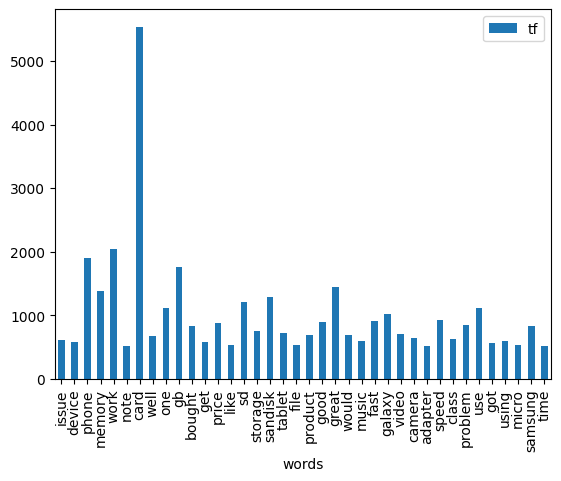

In [65]:
tf[tf['tf']>500].plot.bar(x='words', y='tf')
plt.show()

In [ ]:
# Wordcloud

In [67]:
text = " ".join(i for i in df.reviewText)

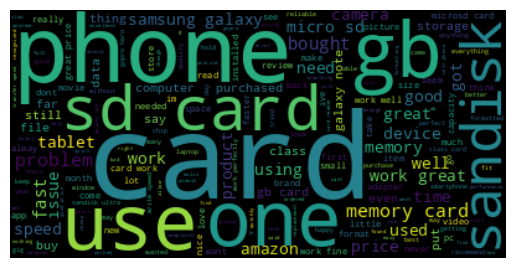

In [68]:
wordcloud = WordCloud().generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
# Şablona Göre Wordcloud

In [69]:
tr_mask = np.array(Image.open('/content/Saadet_Partisi_bayrak.png'))

In [70]:
wc = WordCloud(background_color = 'white',
               max_words = 1000,
               mask = tr_mask,
               contour_width=3,
               contour_color = 'firebrick')

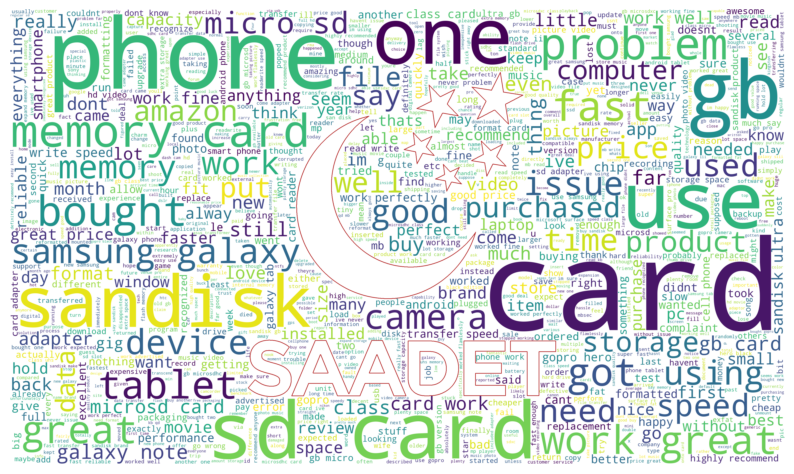

In [71]:
wc.generate(text)
plt.figure(figsize = [10, 10])
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
# Sentiment Analysis - Elimizdeki metinlerin duygusunu anlamak için kullanılır.

In [ ]:
df['reviewText'].head()

In [72]:
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [73]:
sia = SentimentIntensityAnalyzer()
sia.polarity_scores('The film was awesome') # değerlendirmemizi compound' a göre yapıcaz. 0'dan büyükse pozitif anlam içerir.

{'neg': 0.0, 'neu': 0.423, 'pos': 0.577, 'compound': 0.6249}

In [74]:
sia.polarity_scores('I liked this music but it is not good as the other one')

{'neg': 0.207, 'neu': 0.666, 'pos': 0.127, 'compound': -0.298}

In [75]:
df['reviewText'][0:10].apply(lambda x: sia.polarity_scores(x))
df['reviewText'][0:10].apply(lambda x: sia.polarity_scores(x)['compound'])

,reviewText
0,0.00
1,0.00
2,0.40
3,0.65
4,0.86
5,0.00
6,0.87
7,0.82
8,0.00
9,0.92


In [78]:
df['polarity_score'] = df['reviewText'].apply(lambda x: sia.polarity_scores(x)['compound']) # dataframe'e polarity değişkeni eklendi.

In [ ]:
# 4. Sentiment Modeling

In [ ]:
# Feature Engineering